# Predicting Required Amount of Core-Hours for QuackCoRE Compute Job

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import statsmodels


In [2]:
%matplotlib inline

In [3]:
sns.set()

# Loading the Data and Initial Exploration


In [4]:
train_X = pd.read_csv('../data/emod3d_train_x.csv')

In [5]:
train_y = pd.read_csv('../data/emod3d_train_y.csv')

In [6]:
train = pd.concat([train_X, train_y], axis=1)

In [7]:
train

,nt,nx,ny,nz,n_sub,n_cores,core_hours
0,8705.0,904.0,1310.0,245.0,99424,200.0,82.000000
1,2537.0,299.0,195.0,110.0,18360,160.0,2.577778
2,3779.0,313.0,531.0,112.0,48804,160.0,4.755556
3,4787.0,414.0,604.0,120.0,77000,160.0,8.711111
4,2766.0,339.0,352.0,105.0,18135,160.0,2.533333
...,...,...,...,...,...,...,...
11829,12053.0,942.0,1761.0,178.0,684200,320.0,258.311111
11830,6140.0,784.0,939.0,125.0,118272,160.0,22.711111
11831,2849.0,233.0,258.0,100.0,25272,160.0,2.088889
11832,6367.0,743.0,927.0,125.0,109983,160.0,21.155556


In [8]:
train_samp = train.sample(frac=0.05)
train_samp

,nt,nx,ny,nz,n_sub,n_cores,core_hours
8216,3278.0,442.0,437.0,115.0,35360,160.0,4.000000
7407,11280.0,936.0,1312.0,340.0,1,160.0,123.111111
4377,4731.0,619.0,660.0,120.0,78144,160.0,11.377778
1094,4807.0,675.0,624.0,115.0,66576,160.0,11.511111
2039,7604.0,1284.0,1264.0,230.0,59700,160.0,96.622222
...,...,...,...,...,...,...,...
6480,8752.0,1349.0,1140.0,245.0,95264,160.0,100.088889
10637,3832.0,398.0,514.0,118.0,46665,160.0,5.600000
6099,5490.0,575.0,769.0,118.0,83740,160.0,12.488889
4668,2375.0,284.0,281.0,102.0,15051,160.0,1.333333


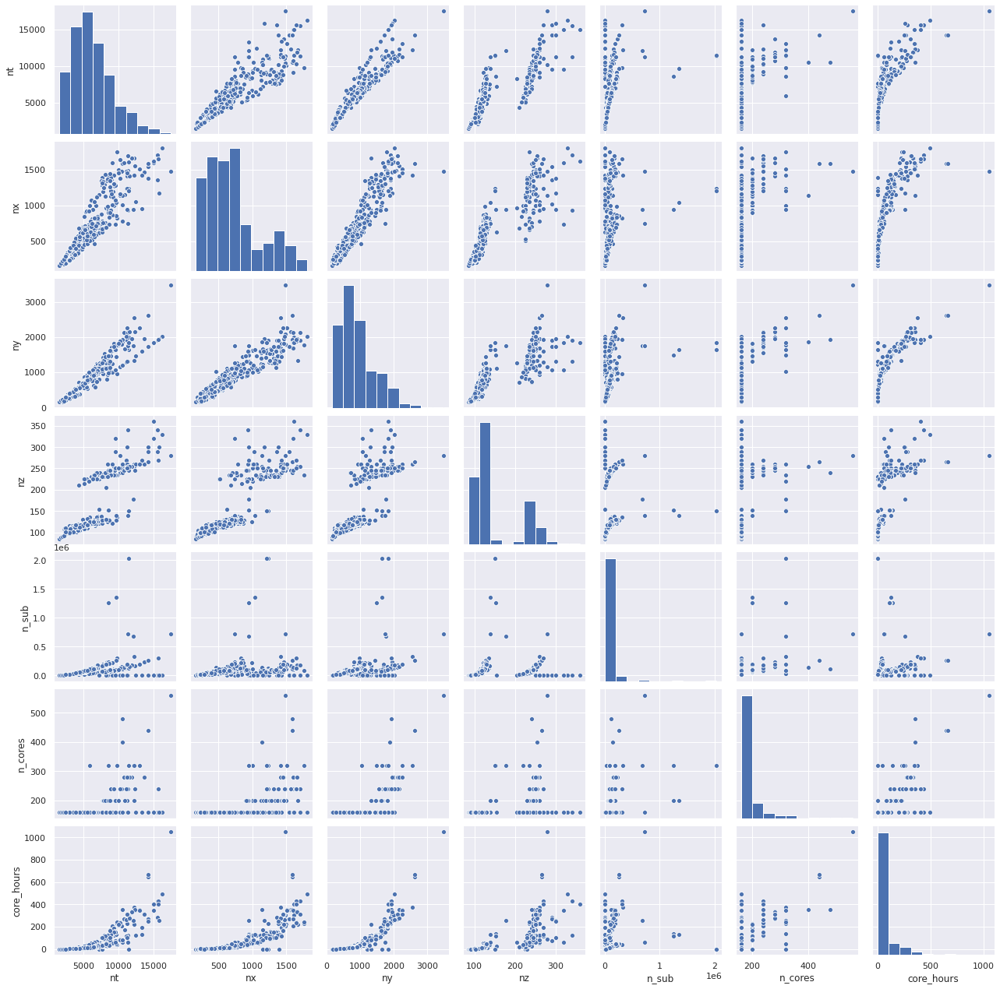

In [9]:
sns.pairplot(train_samp)

## What observations can we make from this data?

- there appears to be a large number of core-hours near 0; better investigate that
- generally around 200 cores were used at a time
- the input `n_sub` is generally always < 0.5 and doesn't appear to be highly correlated with `core_hours`. Its so skewed that it may be worth discarding anything greater, as that might throw off our predictions. The number of dots that lie above `n_sub` > 0.5 eyeballs to be similar to the number of dots that could be considered outliers in the other plots. Perhaps our prediction could by hybrid, using one model when `n_sub` is typically low, and another model when its higher, possibly just fudging in a higher core-hours budget.
- `nx` and `ny`, presumably inputs for some search-space, tend to grow with each other, such that the simulated area tends to be somewhere between a square and rectangle or ratio 1:2 or so.
- `nz` is interesting in that it presumably indicates that studies are done at one of two depths or depth-resolutions... we don't know what `nz` represents

Other thoughts:
- it may be useful to look for core_hours that are very 'round', like for example where the decimal part is .0; that might help identify jobs that reached the budgeted for `core_hours` and were aborted.

# Data Cleaning

## Low end of `core_hours`

It seem that there is a large spike in number of `core_hours` near 0; this may be due to jobs that failed to start. Values that are exactly 0 will not be real jobs, but jobs that do run for a short period of time could still be valid (or might fail for some other reason).

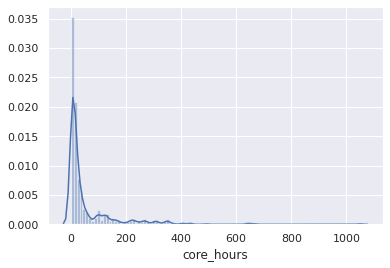

In [10]:
sns.distplot(train_samp['core_hours'], bins=100)

In [11]:
outliers_too_low = train[ train['core_hours'] < 0.2 ]
outliers_too_low

,nt,nx,ny,nz,n_sub,n_cores,core_hours
10,11408.0,1208.0,1831.0,150.0,2035075,320.0,0.0
537,11408.0,1208.0,1831.0,150.0,2035075,320.0,0.0
558,10548.0,1584.0,1923.0,240.0,110740,240.0,0.0
719,11408.0,1208.0,1831.0,150.0,2035075,320.0,0.0
1163,7655.0,1396.0,1318.0,230.0,59055,200.0,0.0
1654,10548.0,1584.0,1923.0,240.0,110740,240.0,0.0
2064,7186.0,1151.0,1213.0,225.0,50960,160.0,0.0
2109,2840.0,324.0,477.0,112.0,106634,320.0,0.0
2124,13830.0,1456.0,2197.0,172.0,3225600,320.0,0.0
2132,11408.0,1208.0,1831.0,150.0,2035075,320.0,0.0


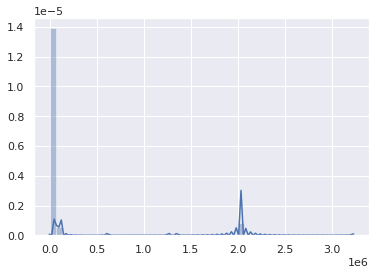

In [12]:
sns.distplot(outliers_too_low)

In [13]:
train.drop(outliers_too_low.index, inplace=True)

In [14]:
train

,nt,nx,ny,nz,n_sub,n_cores,core_hours
0,8705.0,904.0,1310.0,245.0,99424,200.0,82.000000
1,2537.0,299.0,195.0,110.0,18360,160.0,2.577778
2,3779.0,313.0,531.0,112.0,48804,160.0,4.755556
3,4787.0,414.0,604.0,120.0,77000,160.0,8.711111
4,2766.0,339.0,352.0,105.0,18135,160.0,2.533333
...,...,...,...,...,...,...,...
11829,12053.0,942.0,1761.0,178.0,684200,320.0,258.311111
11830,6140.0,784.0,939.0,125.0,118272,160.0,22.711111
11831,2849.0,233.0,258.0,100.0,25272,160.0,2.088889
11832,6367.0,743.0,927.0,125.0,109983,160.0,21.155556


## Identifying `n_sub` in the pairwise plots

`n_sub` is a continuous value, and we would like to identify all those points in the pairwise plots that come from n_sub being high (or low); in case that makes it easy to identify the cause of outliers.

Seaborn's pairplot allows us to give it a `hue` parameter, and you give it the name of a column in the data-frame, and for each value it will break those out as a separate series, but it really needs to a categorical data type. 

That means that we need to (the nomenclature varies) to 'discretize' or 'bin' them.

https://pbpython.com/pandas-qcut-cut.html

In [15]:
train['n_sub_deciles'] = pd.qcut(train['n_sub'], q=10, precision=0)
train_samp['n_sub_deciles'] = pd.qcut(train_samp['n_sub'], q=10, precision=0)

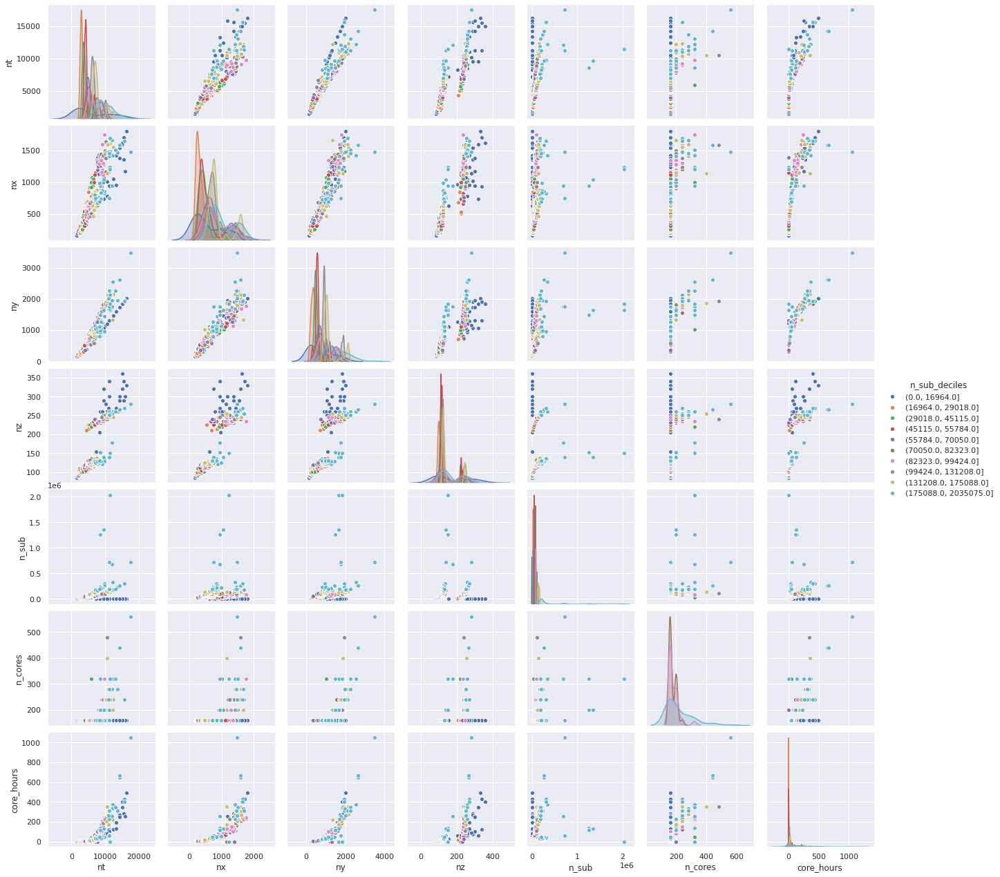

In [16]:
sns.pairplot(train_samp,
    vars=['nt', 'nx', 'ny', 'nz', 'n_sub', 'n_cores', 'core_hours'],
    hue='n_sub_deciles')


## Identifying `n_cores` in the pairplots

Smaller jobs should correlate with fewer cores being requested, which should reflect the user's expectation of how large the job is.

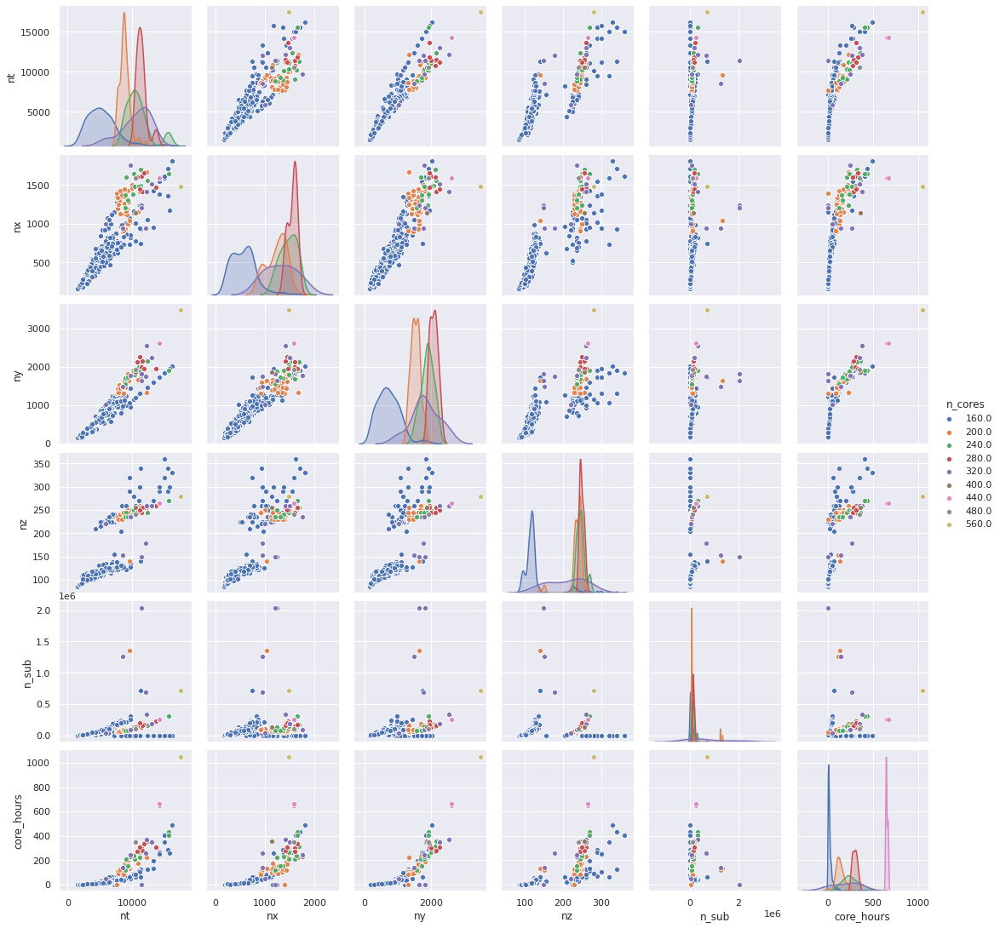

In [17]:
sns.pairplot(train_samp,
    vars=['nt', 'nx', 'ny', 'nz', 'n_sub', 'core_hours'],
    hue='n_cores')

# Should we use a product of nt, nx, ny (and nz) ... ?

The complexity of the simulation would appear to be some product of `nt` (presumably number of time samples), `nx`, `ny` and `nz` (presumably granularity of the 3D simulation). If we use a regression method such as Multiple Regression, then the end up trying to find values for $\alpha$ and the coofficients $\beta_x$ in the following:

$$
\alpha + \beta_1\,nt + \beta_2\,nx + \beta_3\,ny + \beta_4\,nz + \beta_5\,n\_sub + \beta_6\,n\_cores
$$

But if we see an apparent exponential or quadratic type of complexity in time, then it might be better to calculate a new column, such that we get:

$$
ntxyz = nt \times nx \times ny \times nz
$$

$$
\alpha + \beta_1\,ntxyz + \beta_2\,n\_sub + \beta_3\,n\_cores
$$

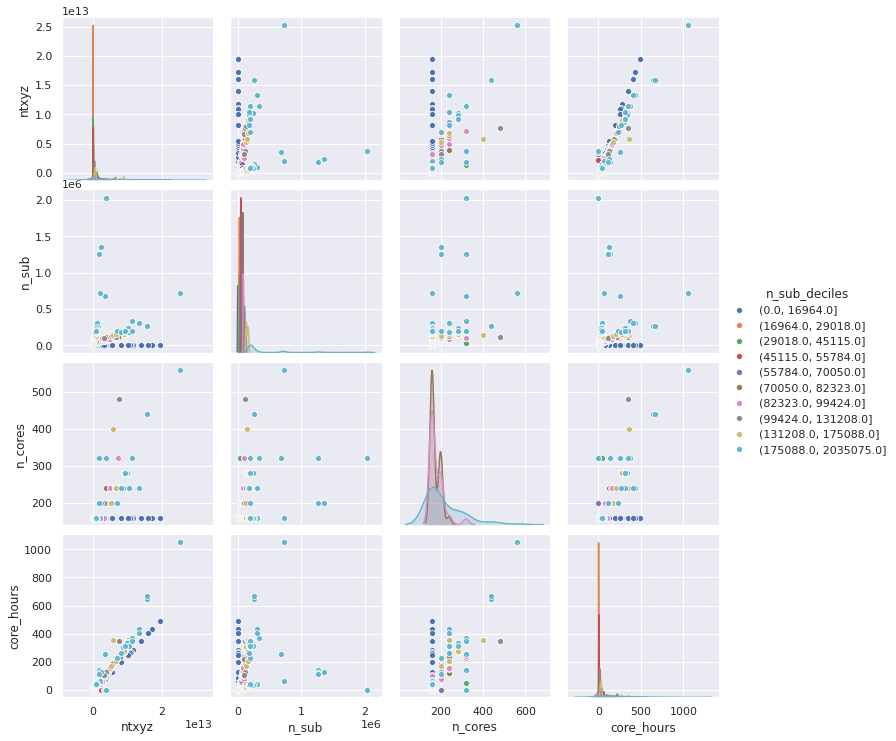

In [18]:
train_samp['ntxyz'] = train_samp['nt'] * train_samp['nx'] * train_samp['ny'] * train_samp['nz']
train['ntxyz'] = train['nt'] * train['nx'] * train['ny'] * train['nz']

sns.pairplot(train_samp, vars=['ntxyz', 'n_sub', 'n_cores', 'core_hours'], hue='n_sub_deciles')

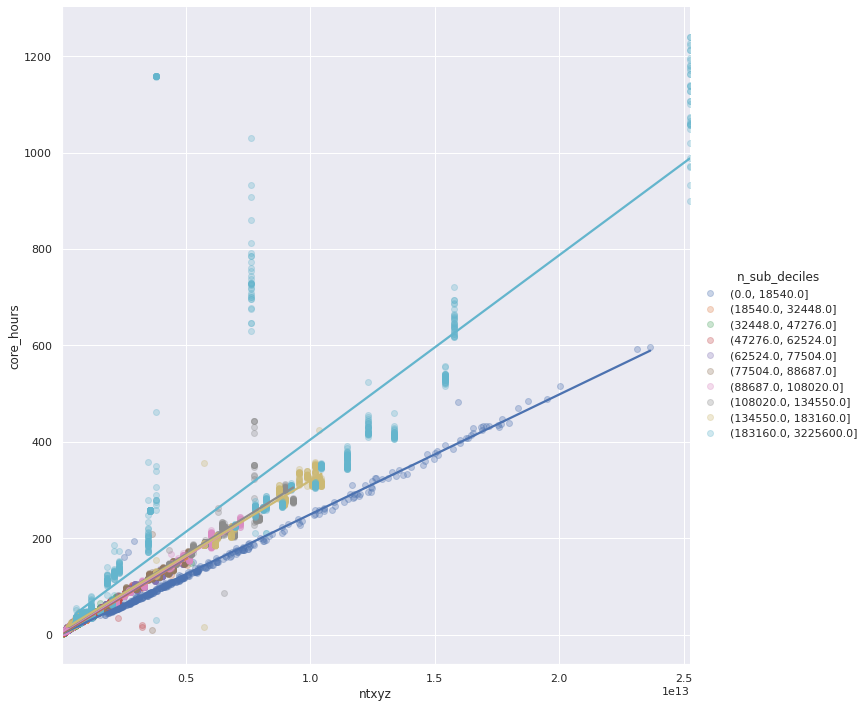

In [35]:
# https://seaborn.pydata.org/tutorial/regression.html

sns.lmplot(
    data=train,
    x='ntxyz',
    y='core_hours',
    hue='n_sub_deciles',
    ci=None,
    height=10,
    scatter_kws={"alpha": .3})

# Default confidence interval it plots is 95%

Aha, so that's very interesting. It would appear that `n_sub`, like `n_cores`, reflect the user's expectation of job size and therefore runtime. This job is not 'embarrassingly parallel' in nature; we can see that as `n_sub` increases, overheads such as communication overheads and lock contention work to slow down the system; this presumably doesn't scale well in that final decile, where there is some very erratic performance. However, the final decile for `n_sub` is very very wide compared to the others, which could also mean that, for example, the 90% percentile is okayish, but the 99% is unusable.

Another reason that may explain the erratic behaviour of `n_sub` would be algorithmic changes: its possible that the code might have exhibited exponential complexity but then this was improved to get closer to linear performance. That could explain why there are a few data-points in the first decile that follow the same sort of exponential curve as the last decile. If that were indeed the case, we could drop them; we'd be unlikely to predict performance for an old version of the software.

Let's use some different bins for n_sub; I want to see more detail in the 90-100th percentile. Let's try bins in log10

In [ ]:
train['n_sub_bins_log10'] = pd.cut(
    train['n_sub'], 
    bins=[0, 1_000, 10_000, 100_000, 1_000_000, 5_000_000, 10_000_000])

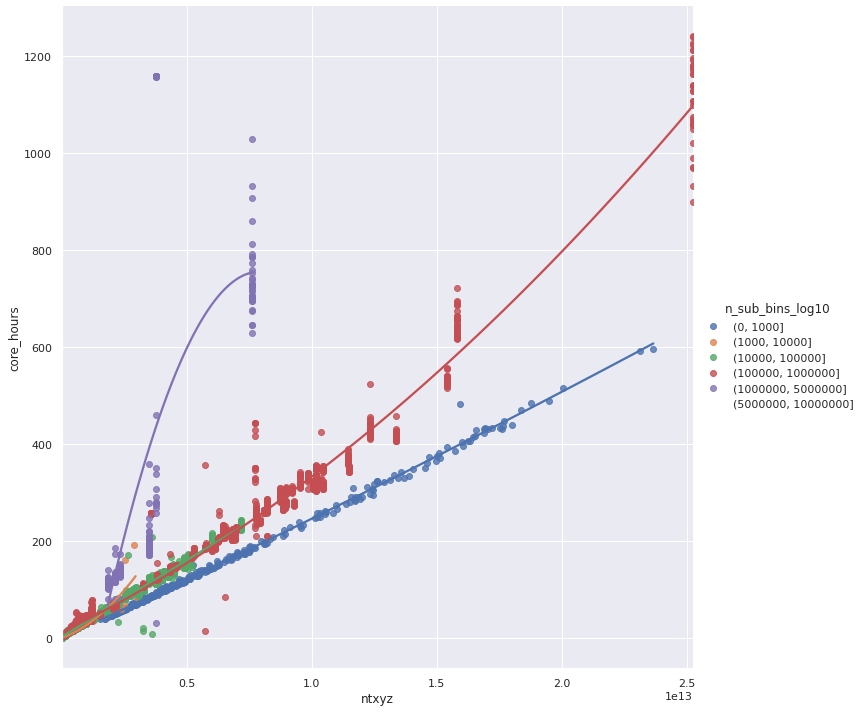

In [68]:
%matplotlib inline
sns.lmplot(
    data=train,
    x='ntxyz',
    y='core_hours',
    hue='n_sub_bins_log10',
    ci=None,
    height=10,
    order=2)

# Hybrid regression?

Given the above, it seems reasonable that we might use a different model (or at least do something different) for particular values of `n_sub`, such as issue a warning, return 0 (sabotaging the prediction but at least not wasting time), or perhaps even just returning a constant number if `ntxyz` and `n_sub` are in particular ranges.

# What should we return for unpredictable inputs?

We want to return a core-hours prediction that is usable (unlikely to cause a job to be aborted due to needing more core-hours than budgeted), and also economical (doesn't request more resources than realistically needed). We need to return a single number, there is no facility to return a number along with some confidence interval.

We could add some confidence interval to the result we return, but for really big jobs that could be a very large over-estimate.

# Now we should have some data ready to normalise

In [20]:
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler

scale = StandardScaler()

train_X[['nt','nx','ny','nz','n_sub','n_cores']]

# scale.fit_transform(train_X[['nt','nx','ny','nz','n_sub','n_cores']].as_matrix())

,nt,nx,ny,nz,n_sub,n_cores
0,8705.0,904.0,1310.0,245.0,99424,200.0
1,2537.0,299.0,195.0,110.0,18360,160.0
2,3779.0,313.0,531.0,112.0,48804,160.0
3,4787.0,414.0,604.0,120.0,77000,160.0
4,2766.0,339.0,352.0,105.0,18135,160.0
...,...,...,...,...,...,...
11829,12053.0,942.0,1761.0,178.0,684200,320.0
11830,6140.0,784.0,939.0,125.0,118272,160.0
11831,2849.0,233.0,258.0,100.0,25272,160.0
11832,6367.0,743.0,927.0,125.0,109983,160.0
